# Fundamentals of the Multivariate Normal Distribution

This appendix will start with some basics on plotting **multidimensional probability density functions (PDFs)**. Then, we will recheck the concepts of **independence** and **dependence** from **DSCI 551** along with its visualization. Finally, we will wrap up the appendix with the **bivariate and multivariate Normal distributions** and some exercises (with their corresponding solutions at the end of the appendix).

## Drawing Multidimensional Functions 

Drawing a $d$-dimensional PDF requires $d + 1$ dimensions, so we usually draw $1$-dimensional functions and occasionally draw $2$-dimensional functions.

A common way to draw $2$-dimensional functions (**not just PDFs!**) is to use **contour plots**. To understand countour plots, you can think of the output dimension as coming **out of the page**. Here are some examples of how to draw $2$-dimensional functions: [**in `Python`**](https://jakevdp.github.io/PythonDataScienceHandbook/04.04-density-and-contour-plots.html) and [**in `R`**](https://www.r-statistics.com/2016/07/using-2d-contour-plots-within-ggplot2-to-visualize-relationships-between-three-variables/).

As an additional example, we provide a contour plot rendering of the elevation of Auckland's Maunga Whau Volcano. [According to the dataset documentation](https://www.rdocumentation.org/packages/datasets/versions/3.6.2/topics/volcano), the $x$-axis indicates grid lines running east to west, whereas the $y$-axis indicates grid lines running south to north. Note that this plot has a legend indicating the volcano's elevation in metres as a colour scale for the corresponding contours.

In [1]:
library(tidyverse)
source("../scripts/ggjointmarg.R")

── Attaching core tidyverse packages ─────────────────────────────────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ───────────────────────────────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors


In [2]:
options(repr.plot.width = 12.5, repr.plot.width = 12.5)

volcano_plot <- volcano %>%
  reshape::melt() %>%
  ggplot(aes(X1, X2)) +
  geom_contour(aes(z = value, colour = after_stat(level))) +
  scale_color_continuous("Elevation (metres)") +
  theme_minimal() +
  theme(
    plot.title = element_text(size = 17, face = "bold"),
    axis.text = element_text(size = 16),
    axis.title = element_text(size = 16, face = "bold"),
    legend.title=element_text(size = 16, face = "bold"), 
    legend.text=element_text(size = 16),
    legend.key.size = unit(1, 'cm')
  ) +
  ggtitle("Topographic Information on Auckland's Maunga Whau Volcano") +
  labs(
    x = "Grid Lines Running East to West",
    y = "Grid Lines Running South to North"
  )

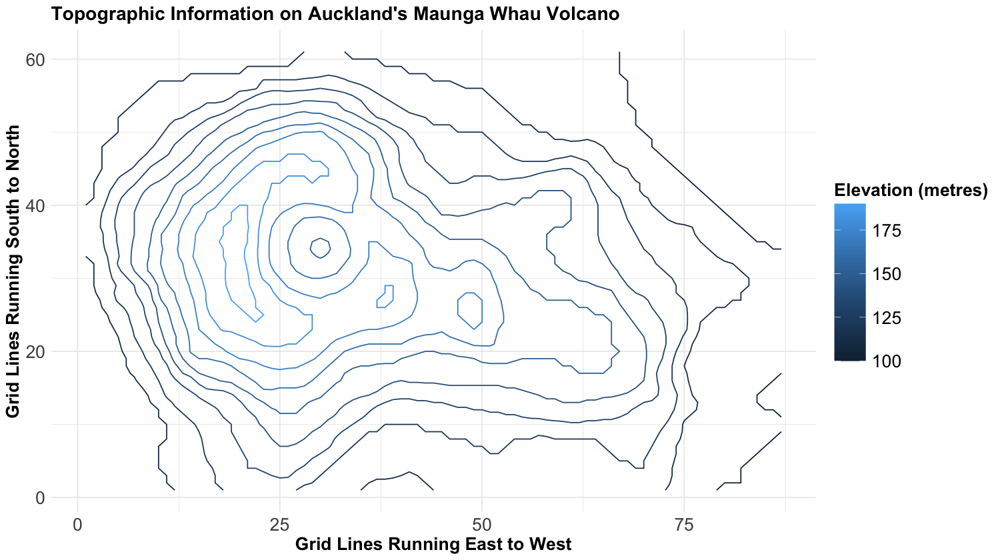

In [3]:
volcano_plot

Let us start with **theoretical contour plots in multivariate continuous distributions**. When it comes to bivariate PDFs, it is informative to plot the marginal densities on each axis. Here is an example where marginals are Normal or Gaussian, and the joint distribution is also a **bivariate Normal or Gaussian** (we will see what this means later on in this appendix!):

In [4]:
library(mvtnorm)
library(cowplot)

x <- seq(-3, 3, length.out = 100)
y <- seq(-3, 3, length.out = 100)
cov_mat <- matrix(c(1, 0.8, 0.8, 1), nrow = 2)

mult_data <- expand.grid(x = x, y = y) %>%
  mutate(z = rep(0, 10000))

mu <- c(0, 0)

for (i in 1:nrow(mult_data)) {
  mult_data$z[i] <- dmvnorm(c(mult_data$x[i], mult_data$y[i]),
    mean = mu, sigma = cov_mat
  )
}


Attaching package: ‘cowplot’


The following object is masked from ‘package:lubridate’:

    stamp




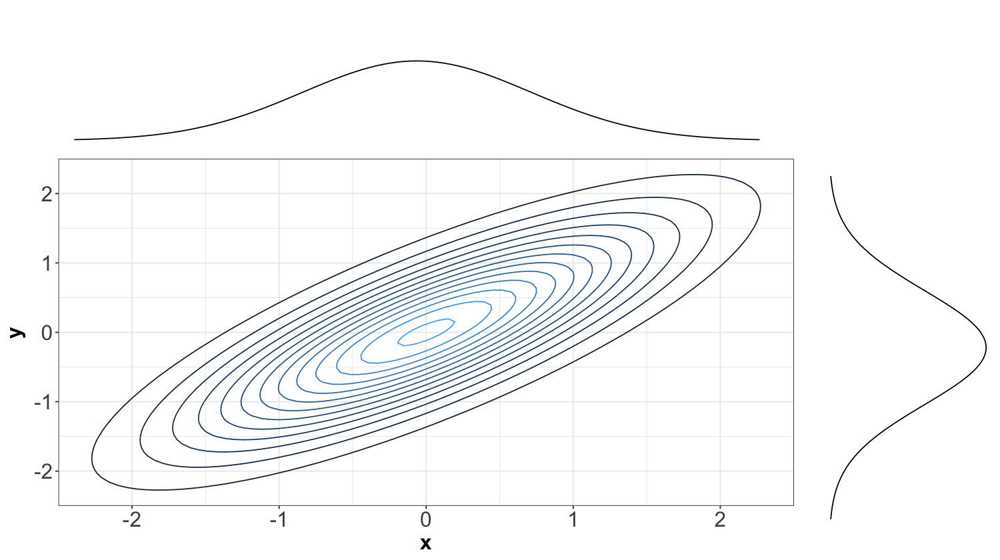

In [5]:
suppressMessages(suppressWarnings(print(plot_grid(
  title, ggjointmarg(mult_data, dnorm, dnorm),
  ncol = 1,
  rel_heights = c(0.1, 1)
))))

The above plot shows the contours corresponding to the density of a bivariate Normal distribution (imagine the PDF is on a third $z$-axis coming out from the screen). The numeric levels as a legend corresponding to the multivariate PDF were omitted to leave room for the corresponding **marginal Normal PDFs** of random variable $X$ on top and random variable $Y$ on the right-hand side. 

We can also check the below three-dimensional plot corresponding to the previous contour plot (we include the legend corresponding to the probability density on the $z$-axis):

In [6]:
library(plotly)


Attaching package: ‘plotly’


The following object is masked from ‘package:ggplot2’:

    last_plot


The following object is masked from ‘package:stats’:

    filter


The following object is masked from ‘package:graphics’:

    layout




In [7]:
z_settings <- list(
  title = "Probability <br>Density"
)

plot_ly(z = sapply(
  x <- seq(-3, 3, .1),
  function(y) (1 / (2 * pi * sqrt(1 - 0.8^2))) * 
    exp(-(y^2 / 2) - ((x - (0.8 * y))^2 / (2 * (1 - 0.8^2))))
), x = x, y = x, type = "surface") %>%
  layout(scene = list(
    zaxis = z_settings
  ))

HTML widgets cannot be represented in plain text (need html)

Recall the PDF tells us how "*densely packed"* data coming from this distribution will be. **Below is the same previous contour plot**, but with a sample of size $n = 300$ plotted overtop. The individual $x$ and $y$ coordinates are also plotted below with their corresponding densities. Notice that points are more densely packed near the middle, where the density function is biggest.

In [8]:
set.seed(551)

sample_mult_norm <- rmvnorm(n = 300, mean = mu, sigma = cov_mat)
sample_mult_norm <- as.data.frame(sample_mult_norm)
names(sample_mult_norm) <- c("x", "y")

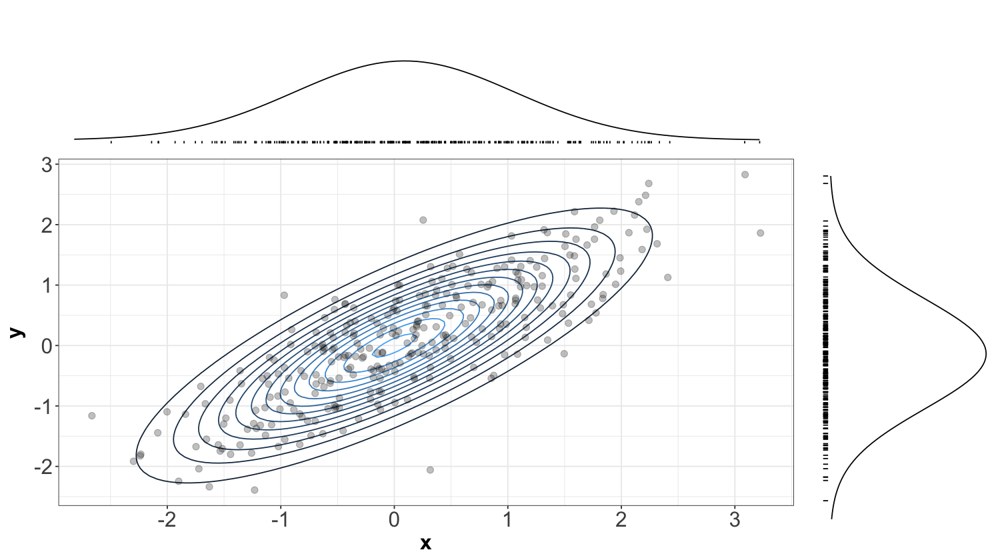

In [9]:
suppressMessages(suppressWarnings(print(plot_grid(
  title, ggjointmarg(mult_data, dnorm, dnorm, sample_mult_norm),
  ncol = 1,
  rel_heights = c(0.1, 1)
))))

## Independence

Let us revisit the concept of probabilistic independence but applied to multivariate continuous distributions. 

### Definition in the Continuous Case

Recall that the independence of random variables $X$ and $Y$ means that knowledge about one variable tells us nothing about the other.

```{admonition} Definition of Independence in Probability Distributions between Two Random Variables
:class: tip
Let $X$ and $Y$ be two **independent** random variables. Using their corresponding marginals, we can obtain their corresponding joint distributions as follows:

- **$X$ and $Y$ are discrete.** Let $P(X = x, Y = y)$ be the joint probability mass function (PMF) with $P(X = x)$ and $P(Y = y)$ as their marginals. Then, we define the joint PMF as:

$$P(X = x, Y = y) = P(X = x) \cdot P(Y = y).$$

- **$X$ and $Y$ are continuous.** Let $f_{X,Y}(x,y)$ be the joint PDF with $f_X(x)$ and $f_Y(y)$ as their marginals. Then, we define the joint PDF as:

$$f_{X,Y}(x,y) = f_X(x) \cdot f_Y(y).$$
```

```{important} 
The term denoting a discrete joint PMF $P(X = x, Y = y)$ is **equivalent** to the intersection of events $P(X = x \cap Y = y)$.
```

In the discrete case, this means that a joint probability distribution (when depicted as a table) has each row/column as a multiple of the others because (by definition of independence):

$$P(X = x \cap Y = y) = P(X = x) \cdot P(Y = y).$$

Or, equivalently,

$$P(Y = y \mid X = x) = \frac{P(X = x \cap Y = y)}{P(X = x)} = \frac{P(X = x) \cdot P(Y = y)}{P(X = x)} = P(Y = y).$$

In the continuous case, probabilities become densities. A definition of independence becomes

```{math}
:label: independent-cont-joint
f_{X,Y}(x, y) = f_X(x) \cdot f_Y(y),
```

where $f_{X,Y}(x, y)$ is the joint PDF of the continuous random variables $X$ and $Y$, $f_X(x)$ is the marginal PDF of $X$, and $f_Y(y)$ is the marginal PDF of $Y$. Or, equivalently

```{math}
:label: cond-cont-joint
f_{Y \mid X}(y) = \frac{f_{X,Y}(x, y)}{f_X(x)}= \frac{f_X(x) \cdot f_Y(y)}{f_X(x)} = f_Y(y).
```

````{important}
Each of these two above definitions has an intuitive meaning. The first definition,

```{math}
f_{X,Y}(x, y) = f_X(x) \cdot f_Y(y)
```

in Equation {eq}`independent-cont-joint`, means that, when slicing the joint density at various points along the $x$-axis (and also for the $y$-axis), the resulting one-dimensional function will be the same, except for some multiplication factor. For example,

```{math}
f_{X,Y}(1, y) = f_X(1) \cdot f_Y(y)
```

and

```{math}
f_{X,Y}(2, y) = f_X(2) \cdot f_Y(y).
```

So $f_{X,Y}(1, y)$ and $f_{X,Y}(2,y)$ are actually the same function, just scaled by different factors. Note that $f_{X,Y}(1,y)$ **is NOT a proper PDF**.

The second definition,

```{math}
f_{Y \mid X}(y) = f_Y(y)
```

in Equation {eq}`cond-cont-joint`, is probably more intuitive. As in the discrete case, it means that knowing $X$ does not tell us anything about $Y$. The same could be said about the reverse. To see why definition in Equation {eq}`independent-cont-joint` is equivalent to the definition in in Equation {eq}`cond-cont-joint`, consider the below formula, which holds regardless of whether we have independence:

```{math}
f_{X,Y}(x, y) = f_{Y \mid X}(y) \ f_X(x).
```

Setting $f_{Y \mid X}(\cdot)$ equal to $f_Y(\cdot)$ results in the original definition from Equation {eq}`independent-cont-joint`.
````

### Independence Visualized

Let us start with **theoretical contour plots in multivariate continuous distributions**. When it comes to bivariate PDFs, it is informative to plot the marginal densities on each axis. In general, just by looking at a contour plot of a bivariate density function, it is hard to tell whether this distribution is of two independent random variables. But we **can** tell by looking at "slices" of the distribution. 

Here is an example of two **independent** random variables where 

$$X \sim \text{Exponential}(\lambda = 1),$$ 

and 

$$Y \sim \mathcal{N}\left(\mu = 0, \sigma^2 = 1\right).$$

Mathematically, their joint PDF is expressed as:

```{math}
\begin{align*}
f_{X,Y} \left( x, y \right) &= f_X \left( x \mid \lambda = 1 \right) \times f_Y \left( y \mid \mu = 0, \sigma^2 = 1 \right) \\
&= \left[ \lambda \exp(-\lambda x) \right] \times \left\{ \frac{1}{\sqrt{2\pi \sigma^2}} \exp \left[ -\frac{(y - \mu)^2}{2\sigma^2} \right] \right\} \\
&= \exp(-x) \times \left[ \frac{1}{\sqrt{2\pi}} \exp \left( -\frac{y^2}{2} \right) \right].
\end{align*}
```

Their corresponding joint PDF is shown in the below three-dimensional plot:

In [10]:
options(repr.plot.width = 20, repr.plot.height = 10)

# NOTE: x and y coordinates are inverted in the code with respect to the random variable setup

z_settings <- list(
  title = "Probability <br>Density"
)

x_settings <- list(
  range = c(0, 3)
)

y_settings <- list(
  range = c(-3, 3)
)

plot_ly(z = sapply(
  x <- seq(-3, 3, .1),
  function(y) dnorm(x) * dexp(y)
), x = x, y = x, type = "surface") %>%
  layout(scene = list(
    xaxis = x_settings,
    yaxis = y_settings,
    zaxis = z_settings
  ))

HTML widgets cannot be represented in plain text (need html)

Now, the previous three-dimensional plot also has a contour version, as shown below. We will slice this contour plot along the dashed orange lines:

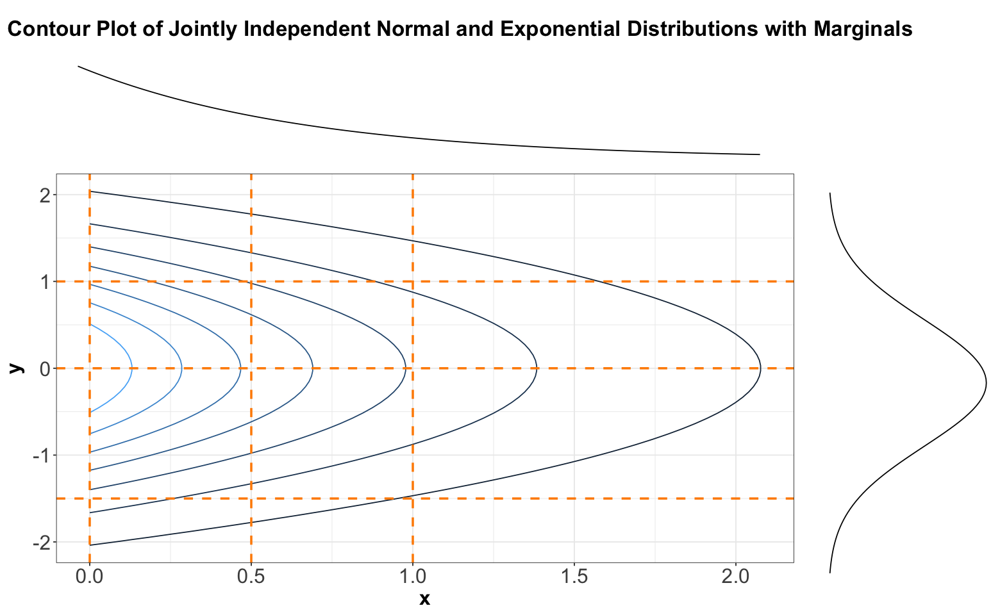

In [11]:
options(repr.plot.width = 13, repr.plot.height = 8)

dindexpn <- function(x, y) dexp(x) * dnorm(y)
slice_loc <- tibble(
  x = c(0, 0.5, 1),
  y = c(-1.5, 0, 1)
)
slices <- list(
  geom_vline(xintercept = slice_loc$x, linetype = "dashed", alpha = 1, colour = "darkorange", linewidth = 1),
  geom_hline(yintercept = slice_loc$y, linetype = "dashed", alpha = 1, colour = "darkorange", linewidth = 1)
)
data_indep <- crossing(
  x = seq(0, 3, length.out = 100),
  y = seq(-3, 3, length.out = 100)
) %>%
  mutate(z = dindexpn(x, y))

title_2 <- ggdraw() + 
  draw_label(
    "Contour Plot of Jointly Independent Normal and Exponential Distributions with Marginals",
    fontface = 'bold',
    x = 0,
    hjust = 0,
    size = 20
  ) +
  theme(
    plot.margin = margin(0, 0, 0, 7)
  )

suppressMessages(suppressWarnings(print(plot_grid(
  title_2, ggjointmarg(data_indep, dexp, dnorm, p21_layers = slices),
  ncol = 1,
  rel_heights = c(0.1, 1)
))))

Below, you can find the slices in each case denoted by the previous dashed orange lines. We can see that these slices resemble the form of Exponential distributions for $x$ and Normal distributions for $y$.

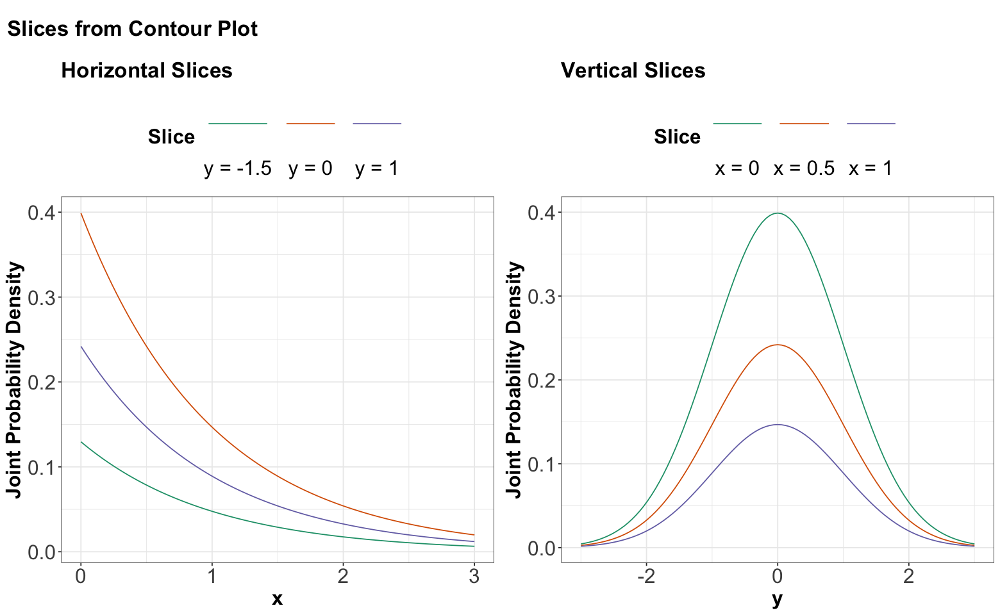

In [12]:
title_3 <- ggdraw() + 
  draw_label(
    "Slices from Contour Plot",
    fontface = 'bold',
    x = 0,
    hjust = 0,
    size = 20
  ) +
  theme(
    plot.margin = margin(0, 0, 0, 7)
  )

exp_and_normal_marginal_plots <- cowplot::plot_grid(
  ggplot(data_indep, aes(x)) +
    map(slice_loc$y, function(y_) {
      stat_function(
        fun = function(x) dindexpn(x, y_),
        mapping = aes(colour = str_c("y = ", y_))
      )
    }) +
    theme_bw() +
    theme(legend.position = "top") +
    ylab("Density") +
    ggtitle("Horizontal Slices") +
  theme(
      plot.title = element_text(size = 20, face = "bold"),
	  axis.text = element_text(size = 19),
	  axis.title = element_text(size = 19, face = "bold"),
	  legend.title=element_text(size = 19, face = "bold"), 
	  legend.text=element_text(size = 19),
      legend.key.size = unit(2, 'cm'),
      legend.spacing.y = unit(0.0002, 'cm')) +
  labs(x = "x", y = "Joint Probability Density") +
  scale_colour_brewer(name = "Slice", palette = "Dark2",
                      guide= guide_legend(label.position = "bottom")),
  ggplot(data_indep, aes(y)) +
    map(slice_loc$x, function(x_) {
      stat_function(
        fun     = function(y) dindexpn(x_, y),
        mapping = aes(colour = str_c("x = ", x_))
      )
    }) +
    theme_bw() +
    theme(legend.position = "top") +
    ylab("Density") +
    ggtitle("Vertical Slices") +
  theme(
      plot.title = element_text(size = 20, face = "bold"),
	  axis.text = element_text(size = 19),
	  axis.title = element_text(size = 19, face = "bold"),
	  legend.title=element_text(size = 19, face = "bold"), 
	  legend.text=element_text(size = 19),
      legend.key.size = unit(2, 'cm'),
      legend.spacing.y = unit(0.0002, 'cm')) +
  labs(x = "y", y = "Joint Probability Density") +
  scale_colour_brewer(name = "Slice", palette = "Dark2",
                      guide= guide_legend(label.position = "bottom")) 
)

plot_grid(
  title_3, exp_and_normal_marginal_plots,
  ncol = 1,
  rel_heights = c(0.1, 1))

Again, looking above, it is not that each vertical (or horizontal) slice is **the same**, but they are all the same **when the slice is normalized**. In other words, every slice has **the same shape**. 

What do we get when we normalize these slices so that the curves have an area of 1 underneath? By definition, we get the conditional distributions **given the slice value**. And, these conditional distributions will be the exact same (one for each axis $x$ and $y$) since the sliced densities only differ by a multiple anyway. What is more, this common distribution is just the marginal.

Mathematically, what we are saying is 

$$f_{Y \mid X}(y) = \frac{f_{X,Y}(x,y)}{f_X(x)} = \frac{f_{X}(x) \cdot f_{Y}(y)}{f_X(x)} = f_Y(y).$$

And we have the same for $X \mid Y$. Again, we are back to the definition of independence!

Now, here is an example where we have **two independent Standard Normal distributions** $X$ and $Y$ whose marginals are the following:

```{math}
\begin{gather*}
X \sim \mathcal{N}(\mu_X = 0, \sigma^2_X = 1) \\
Y \sim \mathcal{N}(\mu_Y = 0, \sigma^2_Y = 1).
\end{gather*}
```

```{important} 
**In general**, not just in the case of joint distributions, we say that a Normal random variable is Standard Normal when its mean equals $0$ and its variance equals 1.
```

Their joint PDF is:

```{math}
\begin{align*}
f_{X,Y} \left( x, y \right) &= f_X \left( x \mid \mu_X = 0, \sigma_X^2 = 1 \right) \times f_Y \left( y \mid \mu_Y = 0, \sigma_Y^2 = 1 \right) \\
&= \left\{ \frac{1}{\sqrt{2\pi \sigma_X^2}} \exp \left[ -\frac{(x - \mu_X)^2}{2\sigma_X^2} \right] \right\} \times \left\{ \frac{1}{\sqrt{2\pi \sigma_Y^2}} \exp \left[ -\frac{(y - \mu_Y)^2}{2\sigma_Y^2} \right] \right\} \\
&= \left[ \frac{1}{\sqrt{2\pi}} \exp \left( -\frac{x^2}{2} \right) \right] \times \left[ \frac{1}{\sqrt{2\pi}} \exp \left( -\frac{y^2}{2} \right) \right].
\end{align*}
```

The above joint distribution is also called a **bivariate Normal or Gaussian**.

In [13]:
x <- seq(-3, 3, length.out = 100)
y <- seq(-3, 3, length.out = 100)
cov_mat <- matrix(c(1, 0, 0, 1), nrow = 2)

mult_data <- expand.grid(x = x, y = y) %>%
  mutate(z = rep(0, 10000))

mu <- c(0, 0)

for (i in 1:nrow(mult_data)) {
  mult_data$z[i] <-dmvnorm(c(mult_data$x[i], mult_data$y[i]),
    mean = mu, sigma = cov_mat
  )
}

In [14]:
options(repr.plot.height = 10)

title_3 <- ggdraw() + 
  draw_label(
    "Contour Plot of an Independent Bivariate Standard Normal Distribution with Marginals",
    fontface = 'bold',
    x = 0,
    hjust = 0,
    size = 17
  ) +
  theme(
    plot.margin = margin(0, 0, 0, 7)
  )

```{important}
Below, we can see the contour plot of this bivariate Normal distribution composed of two independent Standard Normal distributions $X$ and $Y$. Note the contours are **perfectly centred in the middle**, which graphically implies **independence**. 

If $X$ and $Y$ were not independent, then **these contours would appear in a diagonal pattern**.
```

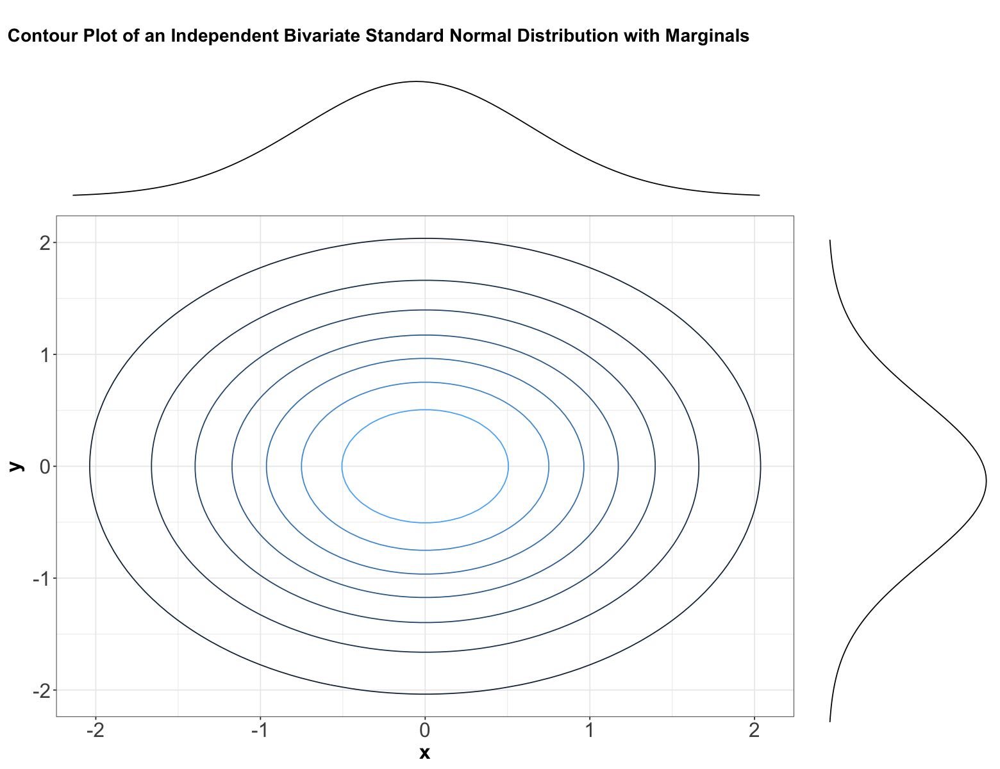

In [15]:
suppressMessages(suppressWarnings(print(plot_grid(
  title_3, ggjointmarg(mult_data, dnorm, dnorm),
  ncol = 1,
  rel_heights = c(0.1, 1)
))))

Its corresponding three-dimensional plot is shown below:

In [16]:
z_settings <- list(
  title = "Probability <br>Density"
)

plot_ly(z = sapply(
  x <- seq(-3, 3, .1),
  function(y) (1 / (2 * pi)) * 
    exp(-(y^2 / 2) - ((x)^2 / (2 * (1))))
), x = x, y = x, type = "surface") %>%
  layout(scene = list(
    zaxis = z_settings
  ))

HTML widgets cannot be represented in plain text (need html)

## Dependence

Two variables can be dependent in a multitude of ways, but usually, there is an overall direction of dependence:

- **Positively related** random variables tend to increase together. That is, larger values of $X$ are associated with larger values of $Y$.
- **Negatively related** random variables have an inverse relationship. That is, larger values of $X$ are associated with smaller values of $Y$.

Here are two positively correlated continuous variables, because there is an overall tendency of the contour lines to point up and to the right (or down and to the left):

``` {figure} ../img/lec07_chnk19_im01.png
:height: 400px
```

Here are two negatively correlated continuous variables, because there is an overall tendency for the contour lines to point down and to the right (or up and to the left):

``` {figure} ../img/lec07_chnk20_im01.png
:height: 400px
```

Note that the marginal distributions have **nothing to do with the dependence** between random variables. Here are some examples of joint distributions that all have the same marginals, namely 

$$\mathcal{N}(\mu = 0, \sigma^2 = 1),$$ 

but different dependence structures and strengths of dependence. Specifically, we have

$$X \sim \mathcal{N}(\mu_x = 0, \sigma_x^2 = 1)$$

and 

$$Y \sim \mathcal{N}(\mu_y = 0, \sigma_y^2 = 1),$$ 

but $(X,Y)$ **is not** jointly Gaussian for these 9 densities:


``` {figure} ../img/lec07_chnk23_im01.png
:height: 500px
```

This echoes the idea that if you are given the marginals of 

$$X \sim \mathcal{N}(\mu_x = 0, \sigma_x^2 = 1)$$ 

and 

$$Y \sim \mathcal{N}(\mu_y = 0, \sigma_y^2 = 1),$$ 

there are (infinitely) many joint distributions that have these marginals. In short, just because you know the marginals, you cannot assume you know the joint distribution **unless the variables are independent**. Hence, when $X$ and $Y$ are independent, their joint density is given by:

$$f_{X,Y}(x, y) = f_{X}(x) \cdot f_{Y}(y).$$

## Multivariate Gaussian or Normal Family

We have already seen the Gaussian/Normal family of **univariate** distributions. There is also a **multivariate** family of Gaussian distributions. 

```{important} 
Members of this family need to have all Gaussian marginals, and their dependence has to be **Gaussian**. Gaussian dependence is obtained as a consequence of requiring that any linear combination of Gaussian random variables is also Gaussian.
```

### Parameters in a Multivariate Gaussian or Normal Distribution

To characterize the **bivariate Gaussian family** (i.e., $d = 2$ involved random variables), we need the following parameters:

- Means for both $X$ and $Y$ denoted as $-\infty < \mu_X < \infty$ and $-\infty < \mu_Y < \infty$, respectively. 
- Variances for both $X$ and $Y$ denoted as $\sigma^2_X > 0$ and $\sigma^2_Y > 0$, respectively.
- The covariance between $X$ and $Y$, sometimes denoted $\sigma_{XY}$ or, equivalently, the Pearson correlation denoted $-1 \leq \rho_{XY} \leq 1$.

That is **five parameters** altogether; and only one of them, **[Pearson correlation](https://ubc-mds.github.io/DSCI_551_stat-prob-dsci/notes/appendix-prob-cheatsheet.html#pearson-s-correlation)** or **[covariance](https://ubc-mds.github.io/DSCI_551_stat-prob-dsci/notes/appendix-prob-cheatsheet.html#covariance)**, is needed to specify the dependence part in a **bivariate Gaussian family**. 
Now, let us define the PDF of the bivariate Gaussian or Normal Distribution in **scalar notation**(i.e., without vectors or matrices).

````{admonition} Definition of a Bivariate Gaussian or Normal Distribution
:class: tip
Let $X$ and $Y$ be two random variables with means $-\infty < \mu_X < \infty$ and $-\infty < \mu_Y < \infty$, variances $\sigma^2_X > 0$ and $\sigma^2_Y > 0$, a Pearson correlation  coefficient $-1 \leq \rho_{XY} \leq 1$. Then, $ X$ and $Y$ have a bivariate Gaussian or Normal distribution if the joint PDF is:

```{math}
:label: bivariate-normal-PDF
\begin{align*}
f_{XY}\left(x, y \mid \mu_X, \mu_Y, \sigma^2_X, \sigma^2_Y, \rho_{XY}\right) &= \frac{1}{2 \pi \sigma_X \sigma_Y \sqrt{1 - \rho_{XY}^2}} \times \\
& \qquad \quad \exp \left\{  - \frac{1}{2 \left( 1 - \rho_{XY}^2 \right)} \left[ \left( \frac{x - \mu_X}{\sigma_X} \right)^2 + \left( \frac{y - \mu_Y}{\sigma_Y} \right)^2 - 2 \rho_{XY} \frac{\left( x - \mu_X \right) \left( y - \mu_Y \right)}{\sigma_X \sigma_Y} \right] \right\}.
\end{align*}
```
````

Using the parameters of a bivariate Gaussian distribution, we can construct two objects that are useful for computations: a **mean vector** $\boldsymbol{\mu}$ and a **covariance matrix** $\boldsymbol{\Sigma}$, where
```{math}
\boldsymbol{\mu}=\begin{pmatrix} \mu_X \\ \mu_Y \end{pmatrix}
```

and

```{math}
:label: covariance-matrix
\boldsymbol{\Sigma} = \begin{pmatrix} \sigma_X^2 & \sigma_{XY} \\ \sigma_{XY} & \sigma_Y^2 \end{pmatrix}.
```

```{important} 
Notice that $\sigma_{XY}$ is repeated in the upper-right and lower-left corner of $\boldsymbol{\Sigma}$. We call this kind of matrix a **symmetric matrix**. It happens that symmetric matrices simplify many of the computations we will do down the road.
```

Note that **the covariance matrix** is always defined as above. Even if we are given the correlation $\rho_{XY}$ instead of the covariance $\sigma_{XY}$, we would then need to calculate the covariance as 

$$\sigma_{XY} = \rho_{XY}  \sigma_X  \sigma_Y$$

before constructing the covariance matrix. However, there is another matrix that is sometimes useful, called the **correlation matrix** $\mathbf{P}$. Firstly, let us recall the formula of the Pearson correlation between $X$ and $Y$:

$$\rho_{XY} = \frac{\operatorname{Cov}(X, Y)}{\sqrt{\operatorname{Var}(X)\operatorname{Var}(Y)}} = \frac{\sigma_{XY}}{\sqrt{\sigma_X^2 \sigma_Y^2}}.$$

Now, what happens to the Pearson correlation of a random variable with itself (i.e., $\rho_{XX}$ and $\rho_{YY}$)? It turns out that:
```{math}
\begin{gather*}
\rho_{XX} = \frac{\operatorname{Cov}(X, X)}{\sqrt{\operatorname{Var}(X)\operatorname{Var}(X)}} = \frac{\text{Var}(X)}{\sqrt{\sigma^2_X \sigma^2_X}} = \frac{\sigma^2_X}{\sigma^2_X} = 1 \\
\rho_{YY} = \frac{\operatorname{Cov}(Y, Y)}{\sqrt{\operatorname{Var}(Y)\operatorname{Var}(Y)}} = \frac{\text{Var}(Y)}{\sqrt{\sigma^2_Y \sigma^2_Y}} = \frac{\sigma^2_Y}{\sigma^2_Y} = 1.
\end{gather*}
```

Thus, **correlation matrix** $\mathbf{P}$ is defined as:
```{math}
\begin{align*}
\mathbf{P} &= \begin{pmatrix} \frac{\sigma^2_X}{\sigma^2_X} & \frac{\sigma_{XY}}{\sqrt{\sigma_X^2 \sigma_Y^2}} \\ \frac{\sigma_{XY}}{\sqrt{\sigma_X^2 \sigma_Y^2}} & \frac{\sigma^2_Y}{\sigma^2_Y} \end{pmatrix}  \\
&= \begin{pmatrix} \rho_{XX} & \rho_{XY} \\ \rho_{XY} & \rho_{YY} \end{pmatrix} \\
&= \begin{pmatrix} 1 & \rho_{XY} \\ \rho_{XY} & 1 \end{pmatrix}.
\end{align*}
```

This **linear algebra** format of the parameters also makes it easier to generalize to more than two variables (i.e., $d > 2$).

In general, the **multivariate Gaussian** distribution of $d$ variables has some generic $d$-dimensional mean vector and a $d \times d$ covariance matrix, where the upper-right and lower-right triangles of the covariance matrix are the same. This means that to fully specify this $d$-dimensional distribution, we need:

- the means and variances of all $d$ random variables, and
- the covariance or correlations between each pair of random variables, i.e.,  $d \choose 2$ pairs of them.

It turns out any square matrix is a valid covariance matrix, so long as it is **symmetric** and **positive semi-definite**. This ensures that each variance is not negative and that $-1 \leq \rho_{ij} \leq 1$ (i.e., each element of the correlation matrix $\mathbf{P}$). Thus, it ensures  
```{math}
| \text{Cov}(X,Y) | \leq \sqrt{\text{Var}(X) \text{Var}(Y)}.
```
Now, let us check an example with $d = 3$ whose random variables are $X$, $Y$, and $Z$. The covariance matrix is given by:
```{math}
\boldsymbol{\Sigma} = \begin{pmatrix} 
   \sigma_X^2  & \sigma_{XY} & \sigma_{XZ} \\ 
   \sigma_{XY} & \sigma_Y^2  & \sigma_{YZ}\\ 
   \sigma_{XZ} & \sigma_{YZ} & \sigma_Z^2 
\end{pmatrix},
```

where the elements of the **main diagonal** correspond to the marginal variances $\sigma_X^2$, $\sigma_Y^2$, and $\sigma_Z^2$. On the other hand, the **off-diagonal** elements correspond to the covariances $\sigma_{XY}$, $\sigma_{XZ}$, and $\sigma_{YZ}$.
The correlation matrix with $d = 3$ will be:
```{math}
\mathbf{P} = \begin{pmatrix} 
   1 & \rho_{XY} & \rho_{XZ} \\ 
   \rho_{XY} & 1  & \rho_{YZ}\\ 
   \rho_{XZ} & \rho_{YZ} & 1 
\end{pmatrix}.
```

Overall with $d = 3$, there are 9 parameters needed to characterize the Gaussian family: 

- 3 for the marginal means $\mu_X$, $\mu_Y$, and $\mu_Z$.
- 3 for the marginal variances $\sigma_X^2$, $\sigma_Y^2$, and $\sigma_Z^2$.
- 3 for all the possible pairwise covariances $\sigma_{XY}$, $\sigma_{XZ}$, and $\sigma_{YZ}$.

```{important} 
Note we do not include the Pearson correlations $\rho_{XY}$, $\rho_{XZ}$, and $\rho_{YZ}$ in this set of 9 parameters, **given they are already in function of the corresponding marginal variances and pairwise covariances**.
```

### Visualizing Bivariate Gaussian or Normal Densities

The joint density of a bivariate Gaussian or Normal distribution has a characteristic **elliptical** shape. Here are some examples with $\mathcal{N}(0, 1)$ marginals for $X$ and $Y$ and different Pearson correlations indicated in the grey title bars:

In [17]:
set.seed(551)

x <- seq(-3, 3, length.out = 100)
y <- seq(-3, 3, length.out = 100)
corr <- c(-0.9, -0.5, 0, 0.5, 0.9)

mult_data_corr <- expand.grid(x = x, y = y, corr = corr) %>%
  mutate(z = rep(0, 50000))

mu <- c(0, 0)

rand_data_corr <- data.frame(corr = rep(c(-0.9, -0.5, 0, 0.5, 0.9), 500)) %>%
  mutate(random_x = rep(0, 2500),
         random_y = rep(0, 2500))

for (i in 1:nrow(mult_data_corr)) {
  mult_data_corr$z[i] <- dmvnorm(c(mult_data_corr$x[i], mult_data_corr$y[i]),
    mean = mu, sigma = matrix(c(1, mult_data_corr$corr[i], mult_data_corr$corr[i], 1), nrow = 2)
  )
}

mult_data_corr <- mult_data_corr %>%
  	mutate(mean = corr * x,
           upper = mean + sqrt(1 - corr^2)*qnorm(0.05),
           lower = mean - sqrt(1 - corr^2)*qnorm(0.05))

for (i in 1:nrow(rand_data_corr)) {
  temp <- rmvnorm(n = 1, mean = mu, sigma = matrix(c(1, rand_data_corr$corr[i], rand_data_corr$corr[i], 1), nrow = 2))
  rand_data_corr$random_x[i] <- temp[1]
  rand_data_corr$random_y[i] <- temp[2]
}

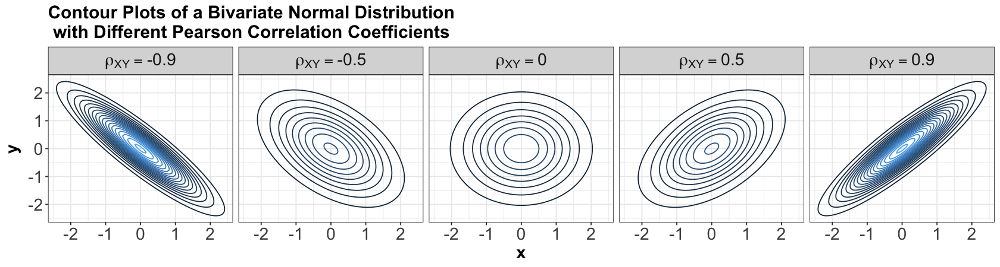

In [18]:
options(repr.plot.height = 3.75, repr.plot.width = 14)

mult_data_plots <- mult_data_corr %>%
  bind_rows() %>% 
	ggplot(aes(x, y)) +
	facet_grid(cols = vars(corr), 
                    labeller = label_bquote(cols = rho[XY]==.(corr))) +
	theme_bw() +
	geom_contour(aes(z = z, colour = after_stat(level)), bins = 20) +
	scale_color_continuous(guide = "none") +
  theme(
    plot.title = element_text(size = 18, face = "bold"),
    axis.text = element_text(size = 17),
    axis.title = element_text(size = 17, face = "bold"),
    strip.text = element_text(size = 17)
  ) +
  ggtitle("Contour Plots of a Bivariate Normal Distribution \n with Different Pearson Correlation Coefficients") +
  labs(
    x = "x",
    y = "y"
  )
mult_data_plots

```{important} 
Note that, when $\rho_{xy} = 0$, the contours are **perfectly centred in the middle**. Hence, we might wonder what we meant by contours perfectly centred in the middle in the above bivariate Normal case composed of two **independent** Standard Normal distributions, so let us explore the five panels below.

An essential component of a Bivariate Normal distribution is the Pearson correlation coefficient, which measures linear dependency between $X$ and $Y$. For our marginal Standard Normal random variables $X$ and $Y$, let us define their Pearson correlation coefficient as $\rho_{XY}$. Overall, the five panels above indicate the following:

- When $X$ and $Y$ are independent, by definition of independence, their $\rho_{XY} = 0$ (as in the above panel in the middle). Therefore, their contours are **perfectly centred in the middle**.
- On the other hand, when $X$ and $Y$ are not independent, their $\rho_{XY} \neq 0$ (as in the other four panels above). Note their contours have a diagonal pattern.
```

Additionally, you can find below five samples of size $n = 500$ each of data coming from the above distributions under different values of $\rho_{XY}$:

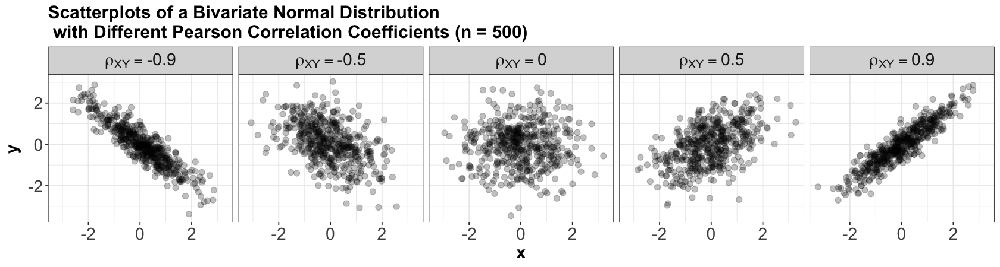

In [19]:
mult_data_random <- rand_data_corr %>%
  bind_rows() %>% 
	ggplot(aes(random_x, random_y)) +
	facet_grid(cols = vars(corr), 
                    labeller = label_bquote(cols = rho[XY]==.(corr))) +
	theme_bw() +
	geom_point(alpha = 0.25, size = 2.5) +
  theme(
    plot.title = element_text(size = 18, face = "bold"),
    axis.text = element_text(size = 17),
    axis.title = element_text(size = 17, face = "bold"),
    strip.text = element_text(size = 17)
  ) +
  ggtitle("Scatterplots of a Bivariate Normal Distribution \n with Different Pearson Correlation Coefficients (n = 500)") +
  labs(
    x = "x",
    y = "y"
  )
mult_data_random

```{important} 
**Let us discuss the case of bivariate Gaussians specifically**, uncorrelated (i.e., $\rho_{XY} = 0$) implies $X$ and $Y$ are independent. But, remember **in general**, uncorrelated often does not imply independence. 
```

````{admonition} Note
:class: note
The previous statement is proved if we work around via the PDF {eq}`bivariate-normal-PDF` with $\rho_{XY} = 0$:

```{math}
\begin{align*}
f_{XY}\left(x, y \mid \mu_X, \mu_Y, \sigma^2_X, \sigma^2_Y, \rho_{XY} = 0 \right) &= \frac{1}{2 \pi \sigma_X \sigma_Y \sqrt{1 - \rho_{XY}^2}} \times \\
& \qquad \quad \exp \left\{  - \frac{1}{2 \left( 1 - \rho_{XY}^2 \right)} \left[ \left( \frac{x - \mu_X}{\sigma_X} \right)^2 + \left( \frac{y - \mu_Y}{\sigma_Y} \right)^2 - 2 \rho_{XY} \frac{\left( x - \mu_X \right) \left( y - \mu_Y \right)}{\sigma_X \sigma_Y} \right] \right\} \\
&= \frac{1}{2 \pi \sigma_X \sigma_Y} \times \qquad \qquad \qquad \qquad \qquad \qquad \qquad \qquad \qquad  \text{ we let }\rho_{XY} = 0 \\
& \qquad \quad \exp \left\{  - \frac{1}{2} \left[ \left( \frac{x - \mu_X}{\sigma_X} \right)^2 + \left( \frac{y - \mu_Y}{\sigma_Y} \right)^2 \right] \right\} \\
&= \frac{1}{\sqrt{2 \pi \sigma_X^2} \sqrt{ 2 \pi \sigma_Y^2}} \times \qquad \qquad \qquad \qquad \qquad \qquad \text{rearranging terms}\\
& \qquad \quad \exp \left[-\frac{1}{2} \left( \frac{x - \mu_X}{\sigma_X} \right)^2 \right] \times \exp \left[-\frac{1}{2} \left( \frac{y - \mu_Y}{\sigma_Y} \right)^2 \right] \\
&= \underbrace{\frac{1}{\sqrt{2 \pi \sigma_X^2}} \exp \left[-\frac{1}{2} \left( \frac{x - \mu_X}{\sigma_X} \right)^2 \right]}_{f_X(x \mid \mu_X, \sigma_X^2)} \times \underbrace{\frac{1}{\sqrt{2 \pi \sigma_Y^2}} \exp \left[-\frac{1}{2} \left( \frac{y - \mu_Y}{\sigma_Y} \right)^2 \right]}_{f_Y(y \mid \mu_Y, \sigma_Y^2)}.
\end{align*}
```

The above last line corresponds to the mathematical definition of independence provided in {eq}`independent-cont-joint`. Moreover, $f_X(x \mid \mu_X, \sigma_X^2)$ and $f_Y(y \mid \mu_Y, \sigma_Y^2)$ correspond to the marginal distributions

$$X \sim \mathcal{N}(\mu_X, \sigma_X^2)$$

and 

$$Y \sim \mathcal{N}(\mu_Y, \sigma_Y^2),$$

respectively.
````
Let us take a look at uncorrelated densities, but with different variances, and means of $0$:

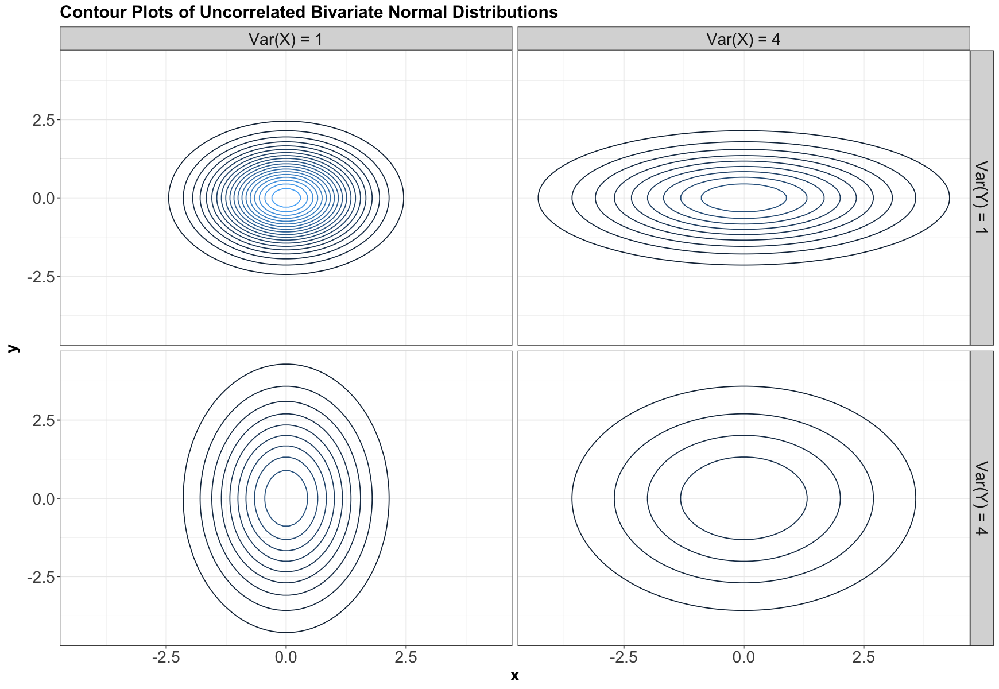

In [20]:
options(repr.plot.height = 10, repr.plot.width = 14.5)

varx <- c(1, 4)
vary <- c(1, 4)

grid <- crossing(
  x = seq(-6, 6, length.out = 100),
  y = seq(-6, 6, length.out = 100)
)
crossing(varx, vary) %>%
  mutate(dens = map2(
    varx, vary,
    ~ grid %>%
      mutate(z = dnorm(x, sd = sqrt(.x)) * dnorm(y, sd = sqrt(.y)))
  )) %>%
  unnest(dens) %>%
  mutate(
    varx = str_c("Var(X) = ", varx),
    vary = str_c("Var(Y) = ", vary)
  ) %>%
  ggplot(aes(x, y)) +
  facet_grid(vary ~ varx) +
  geom_contour(aes(z = z, colour = after_stat(level)), bins = 20) +
  scale_color_continuous(guide = "none") +
  theme_bw() +
  theme(
    plot.title = element_text(size = 18, face = "bold"),
    axis.text = element_text(size = 17),
    axis.title = element_text(size = 17, face = "bold"),
    strip.text = element_text(size = 17)
  ) +
  ggtitle("Contour Plots of Uncorrelated Bivariate Normal Distributions") +
  labs(
    x = "x",
    y = "y"
  )

**Notice that elliptical contours stretched either vertically or horizontally still have no dependence!** The stretch needs to be on some diagonal for there to be dependence -- that is, pointing in some direction other than along the $x$-axis or $y$-axis. Circular contours are both independent, and each marginal has the same variance. 

(bivariate-normal-properties)=
### Properties

The **bivariate** Gaussian or Normal distribution has the following properties:

1. **Marginal distributions are Gaussian.** The marginal distribution of a subset of variables can be obtained by just taking the relevant subset of means, and the relevant subset of the covariance matrix.
2. **Linear combinations are Gaussian.** This is actually by definition. If $(X, Y)$ have a bivariate Gaussian or Normal distribution with marginal means $\mu_X$ and $\mu_Y$ along with marginal variances $\sigma^2_X$ and $\sigma^2_Y$ and covariance $\sigma_{XY}$; then $Z = aX + bY + c$ with constants $a, b, c$ is Gaussian. If we want to find the mean and variance of $Z$, we apply the linearity of expectations and variance rules:

```{math}
\begin{align*}
\mathbb{E}(Z) &= \mathbb{E}(aX + bY + c) \\
&= \mathbb{E}(aX) + \mathbb{E}(bY) + \mathbb{E}(c) \\
&= a \mathbb{E}(X) + b \mathbb{E}(Y) + c \\
&= a \mu_X + b \mu_Y + c.
\end{align*}
```
```{math}
\begin{align*}
\text{Var}(Z) &= \text{Var}(aX + bY + c) \\
&= \text{Var}(aX) + \text{Var}(bY) + \text{Var}(c) + 2 \text{Cov}(aX, bY) \\
&= a^2 \text{Var}(X) + b^2 \text{Var}(Y) + 0 + 2ab \text{Cov}(X, Y) \\
&= a^2 \sigma_X^2 + b^2 \sigma_Y^2 + 2ab \sigma_{XY}.
\end{align*}
```

```{important} 
The same rules apply with more than two Gaussian or Normal random variables. In the case of the variance, the formula will need to include all pairwise covariances.
```

3. **Conditional distributions are Gaussian.** If $(X, Y)$ have a bivariate Gaussian or Normal distribution with marginal means $\mu_X$ and $\mu_Y$ along with marginal variances $\sigma^2_X$ and $\sigma^2_Y$ and covariance $\sigma_{XY}$; then the distribution of $Y$ given that $X = x$ is also Gaussian. Its distribution is

$$Y \mid X = x \sim \mathcal{N} \left(\mu_{_{Y \mid X = x}} = \mu_Y + \frac{\sigma_Y}{\sigma_X} \rho_{XY} (x - \mu_X), \sigma^2_{_{Y \mid X = x}} = \ (1 - \rho_{XY}^2)\sigma_Y^2 \right).$$

Here is what is going on here: 

- The conditional mean is linear in $x$ and passes through the mean $(\mu_X, \mu_Y)$, and has a steeper slope with higher correlation.
- The conditional variance is smaller than the marginal variance, and gets smaller with higher correlation.

Here are the conditional means and 90% prediction intervals for the previous plots of bivariate Gaussians with different correlations:

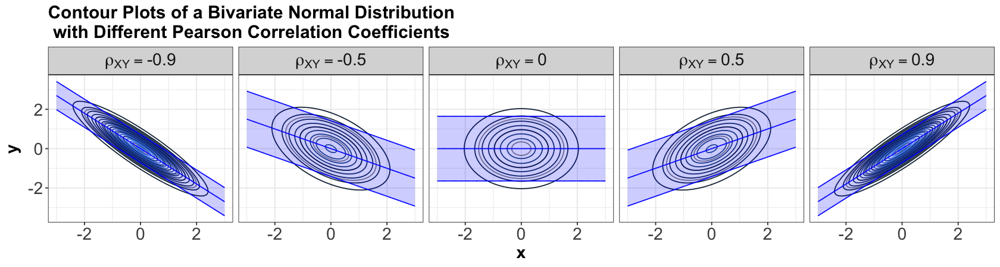

In [21]:
options(repr.plot.height = 3.75, repr.plot.width = 14)

mult_data_plots +
	geom_contour(aes(z = z), colour = "black", alpha = 0.5) +
	geom_ribbon(aes(ymin = lower, ymax = upper), fill = "blue", alpha = 0.2) +
	geom_line(aes(y = mean), colour = "blue") +
	geom_line(aes(y = lower), colour = "blue") +
	geom_line(aes(y = upper), colour = "blue")

```{admonition} Note
:class: note
If you want to know the formula for conditional distributions in the general multivariate case, you can find it online (e.g., [Wikipedia](https://en.wikipedia.org/wiki/Multivariate_normal_distribution#Conditional_distributions)). It involves matrix algebra with the covariance matrix and mean vector.
```

## Some Exercises

Consider the multivariate Gaussian distribution of random variables $X$, $Y$, and $Z$ with its respective **mean vector**

$$\boldsymbol{\mu} = \begin{pmatrix} \mu_X \\ \mu_Y \\ \mu_Z \end{pmatrix} = \begin{pmatrix} 0 \\ 2 \\ 3 \end{pmatrix},$$

correlation matrix

$$\mathbf{P} = \begin{pmatrix} 
\rho_{XX}   & \rho_{XY} & \rho_{XZ} \\ 
\rho_{XY} & \rho_{YY}   & \rho_{YZ} \\ 
\rho_{XZ} & \rho_{YZ} & \rho_{ZZ} 
\end{pmatrix} = \begin{pmatrix} 
1   & 0.2 & 0.1 \\ 
0.2 & 1   & 0.2 \\ 
0.1 & 0.2 & 1 
\end{pmatrix},$$

and **marginal variances**
```{math}
\begin{gather*}
\sigma_X^2 = 1 \\
\sigma_Y^2 = 1 \\
\sigma_Z^2 = 1.
\end{gather*}
```

Now, let us proceed with some exercises.

```{exercise}
:label: app-multivariate-normal-q1

What is the distribution of $X$? Select the correct option:

**A.** $X \sim \mathcal{N}(\mu_X = 3, \sigma_X^2 = 1)$

**B.** $X \sim \mathcal{N}(\mu_X = 0, \sigma_X^2 = 1)$

**C.** $X \sim \mathcal{N}(\mu_X = 0, \sigma_X^2 = -1)$

**D.** $X \sim \mathcal{N}(\mu_X = 2, \sigma_X^2 = 1)$
```

```{exercise}
:label: app-multivariate-normal-q2

What is the **joint distribution** of $X$ and $Z$? Select the correct option:

**A.** $X \sim \mathcal{N}(\mu_X = 1, \sigma_X^2 = 1)$ and $Z \sim \mathcal{N}(\mu_Z = 3, \sigma_Z^2 = 1)$

**B.** Bivariate Gaussian with mean vector $(\mu_X, \mu_Y)^T = (0, 2)^T$, variances $\sigma_X^2 = 1$ and $\sigma_Y^2 = 1$, and $\rho_{XY} = 0.2$

**C.** $X \sim \mathcal{N}(\mu_X = 1, \sigma_X^2 = 1)$ and $Y \sim \mathcal{N}(\mu_Y = 2, \sigma_Y^2 = 1)$

**D.** Bivariate Gaussian with mean vector $(\mu_X, \mu_Z)^T = (0, 3)^T$, variances $\sigma_X^2 = 1$ and $\sigma_Z^2 = 1$, and $\rho_{XZ} = 0.1$
```

```{exercise}
:label: app-multivariate-normal-q3

What is the distribution of $Y$, given that $X = 0.5$?
```

In [22]:
set.seed(551)

x <- seq(-5, 5, length.out = 200)
y <- seq(-5, 5, length.out = 200)
corr <- c(0.2)

mult_data_corr <- expand.grid(x = x, y = y, corr = corr) %>%
  mutate(z = rep(0, 40000))

mu <- c(0, 2)

rand_data_corr <- data.frame(corr = rep(c(0.2), 500)) %>%
  mutate(random_x = rep(0, 500),
         random_y = rep(0, 500))

In [23]:
for (i in 1:nrow(mult_data_corr)) {
  mult_data_corr$z[i] <- dmvnorm(c(mult_data_corr$x[i], mult_data_corr$y[i]),
    mean = mu, sigma = matrix(c(1, mult_data_corr$corr[i], mult_data_corr$corr[i], 1), nrow = 2)
  )
}

mult_data_corr <- mult_data_corr %>%
  	mutate(mean = 2 + 0.2 * x,
           upper = mean + sqrt(1 - corr^2)*qnorm(0.05),
           lower = mean - sqrt(1 - corr^2)*qnorm(0.05))

for (i in 1:nrow(rand_data_corr)) {
  temp <- rmvnorm(n = 1, mean = mu, sigma = matrix(c(1, rand_data_corr$corr[i], rand_data_corr$corr[i], 1), nrow = 2))
  rand_data_corr$random_x[i] <- temp[1]
  rand_data_corr$random_y[i] <- temp[2]
}

```{exercise}
:label: app-multivariate-normal-q4

What is the distribution of $V = Y - 3X$?
```

```{exercise}
:label: app-multivariate-normal-q5


What is $P(Y < 3X)$?
```

### Answers

````{solution} app-multivariate-normal-q1
:label: app-multivariate-normal-q1-ans

By [property (1)](bivariate-normal-properties), it is $X \sim \mathcal{N}(\mu_X = 0, \sigma_X^2 = 1)$.
````

````{solution} app-multivariate-normal-q2
:label: app-multivariate-normal-q2-ans

By [property (1)](bivariate-normal-properties), it is bivariate Gaussian with mean vector $(\mu_X, \mu_Z)^T = (0, 3)^T$, variances $\sigma_X^2 = 1$ and $\sigma_Z^2 = 1$, and $\rho_{XZ} = 0.1$. 

We just subset the relevant variables by taking the relevant subset of means and variances, and the relevant Pearson correlation.
````

````{solution} app-multivariate-normal-q3
:label: app-multivariate-normal-q3-ans

By [property (3)](bivariate-normal-properties), it is univariate Gaussian:

```{math}
\begin{gather*}
Y \mid X = 0.5 \sim \mathcal{N} \left(\mu_{_{Y \mid X = 0.5}} = \mu_Y + \frac{\sigma_Y}{\sigma_X}\rho_{XY} (x - \mu_X), \sigma^2_{_{Y \mid X = 0.5}} = \ (1 - \rho_{XY}^2)\sigma_Y^2 \right) \\
Y \mid X = 0.5 \sim \mathcal{N} \left(\mu_{_{Y \mid X = 0.5}} = 2 + \frac{1}{1}(0.2) (0.5 - 0), \sigma^2_{_{Y \mid X = 0.5}} = \ (1 - 0.2^2) 1^2 \right) \\
Y \mid X = 0.5 \sim \mathcal{N} \left( \mu_{_{Y \mid X = 0.5}} = 2.1, \sigma^2_{_{Y \mid X = 0.5}}= 0.96 \right).
\end{gather*}
```
````

````{solution} app-multivariate-normal-q4
:label: app-multivariate-normal-q4-ans

By [property (2)](bivariate-normal-properties), it is univariate Gaussian. We compute the following:

```{math}
\begin{align*}
\mu_V &= \mathbb{E}(V) \\
&= \mathbb{E}(Y - 3X) \\
&= \mu_Y - 3 \mu_X \\
&= 2 - 3(0) = 2
\end{align*}
```

```{math}
\begin{align*}
\sigma^2_V &= \text{Var}(V) \\
&= \sigma_Y^2 + (-3)^2 \sigma_X^2 + 2(-3) \sigma_{XY} \\
&= \sigma_Y^2 + 9 \sigma_X^2 + 2(-3) \rho_{XY} \sigma_X \sigma_Y \\
&= 1 + 9(1) - 6(0.2)(1)(1) \\
&= 8.8.
\end{align*}
```

Therefore:

```{math}
V \sim \mathcal{N}(\mu_V = 2, \sigma^2_V = 8.8).
```
````

````{solution} app-multivariate-normal-q5
:label: app-multivariate-normal-q5-ans

We can use the following:
```{math}
\begin{align*}
P(Y < 3X) &= P(Y - 3X < 0) \\
&= P(V < 0).
\end{align*}
```

We already know the distribution of $V$:

```{math}
V \sim \mathcal{N}(\mu_V = 2, \sigma^2_V = 8.8).
```

Thus, we use `pnorm()` as in the below code. Therefore:

```{math}
P(Y < 3X) = 0.25.
```
````

In [24]:
round(pnorm(q = 0, mean = 2, sd = sqrt(8.8)), 2)

[1] 0.25